In [ ]:
import cv2 as cv2

In [ ]:
from google.colab.patches import cv2_imshow

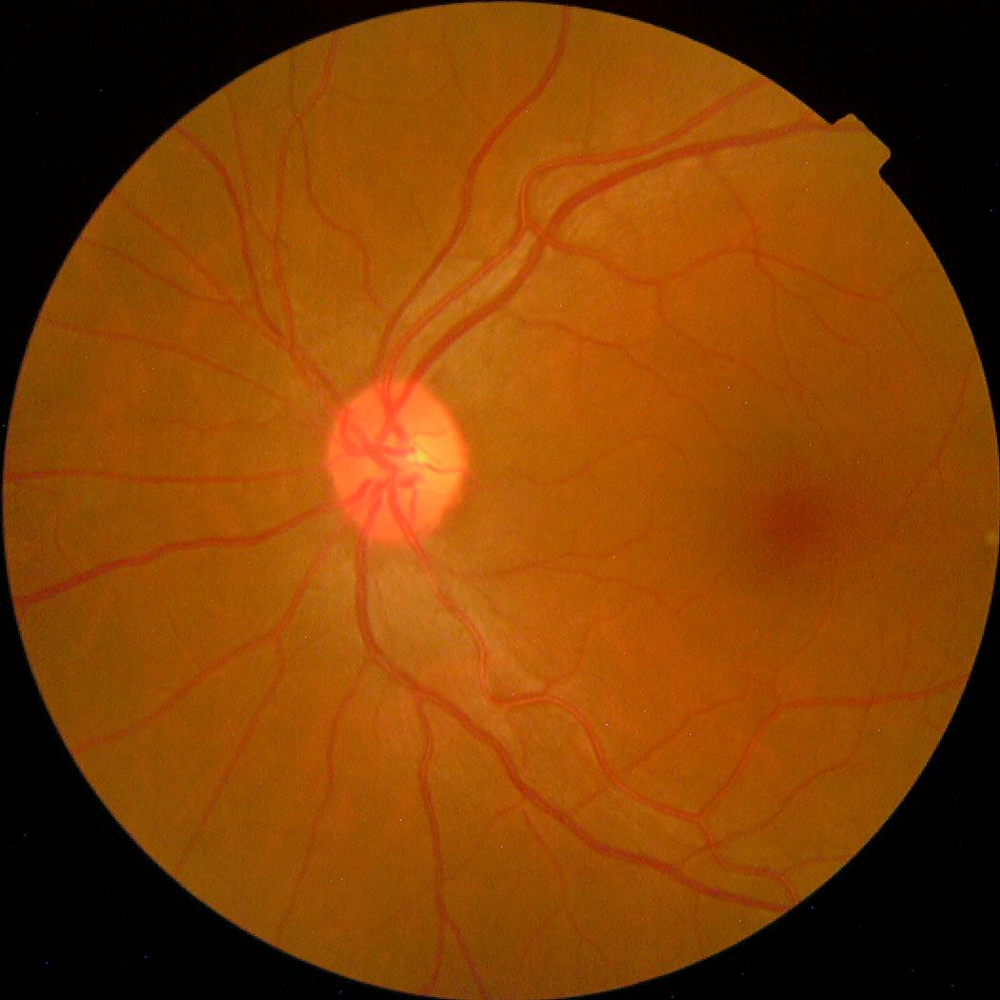

In [ ]:
img = cv2.imread("/content/00f6c1be5a33.png")
cv2_imshow(img)

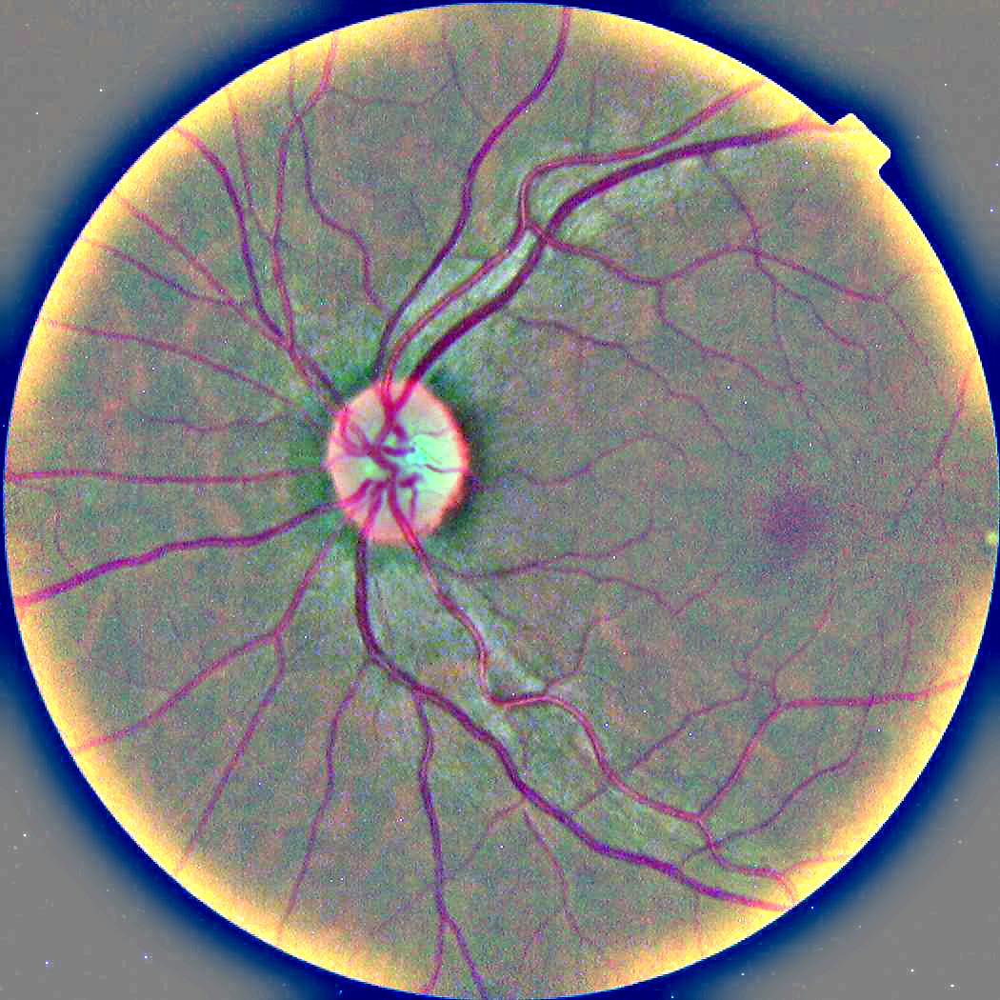

In [ ]:
img_t = cv2.addWeighted(img,4, cv2.GaussianBlur(img , (0,0) , 30) ,-4 ,128)
cv2_imshow(img_t)

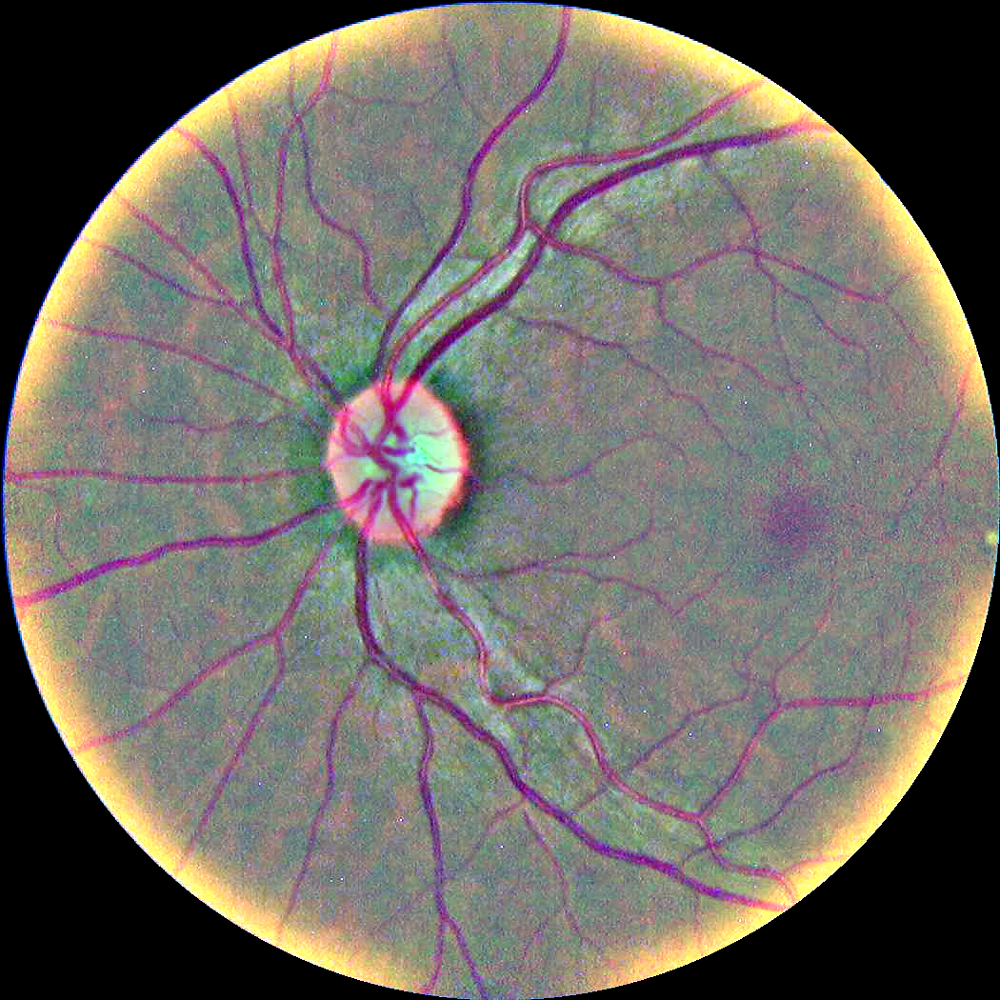

In [ ]:
import numpy as np
img_t = cv2.addWeighted(img,4, cv2.GaussianBlur(img , (0,0) , 30) ,-4 ,128)
img = img_t
# Get the center of the image
h, w = img.shape[:2]
cx, cy = w // 2, h // 2

# Define the radius of the circle
r = min(cx, cy)

# Create a mask
mask = np.zeros((h, w), np.uint8)
cv2.circle(mask, (cx, cy), r, 1, -1)

# Apply the mask to the image
result = cv2.bitwise_and(img, img, mask=mask)

# Save the cropped image or display it on screen
cv2_imshow( result)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
def preprocessed_img(img_path):
  img = cv2.imread(img_path)
  img_t = cv2.addWeighted(img,4, cv2.GaussianBlur(img , (0,0) , 30) ,-4 ,128)
  img = img_t
  h, w = img.shape[:2]
  cx, cy = w // 2, h // 2

  # Define the radius of the circle
  r = min(cx, cy)

  # Create a mask
  mask = np.zeros((h, w), np.uint8)
  cv2.circle(mask, (cx, cy), r, 1, -1)

  # Apply the mask to the image
  result = cv2.bitwise_and(img, img, mask=mask)

  # Save the cropped image or display it on screen
  return result

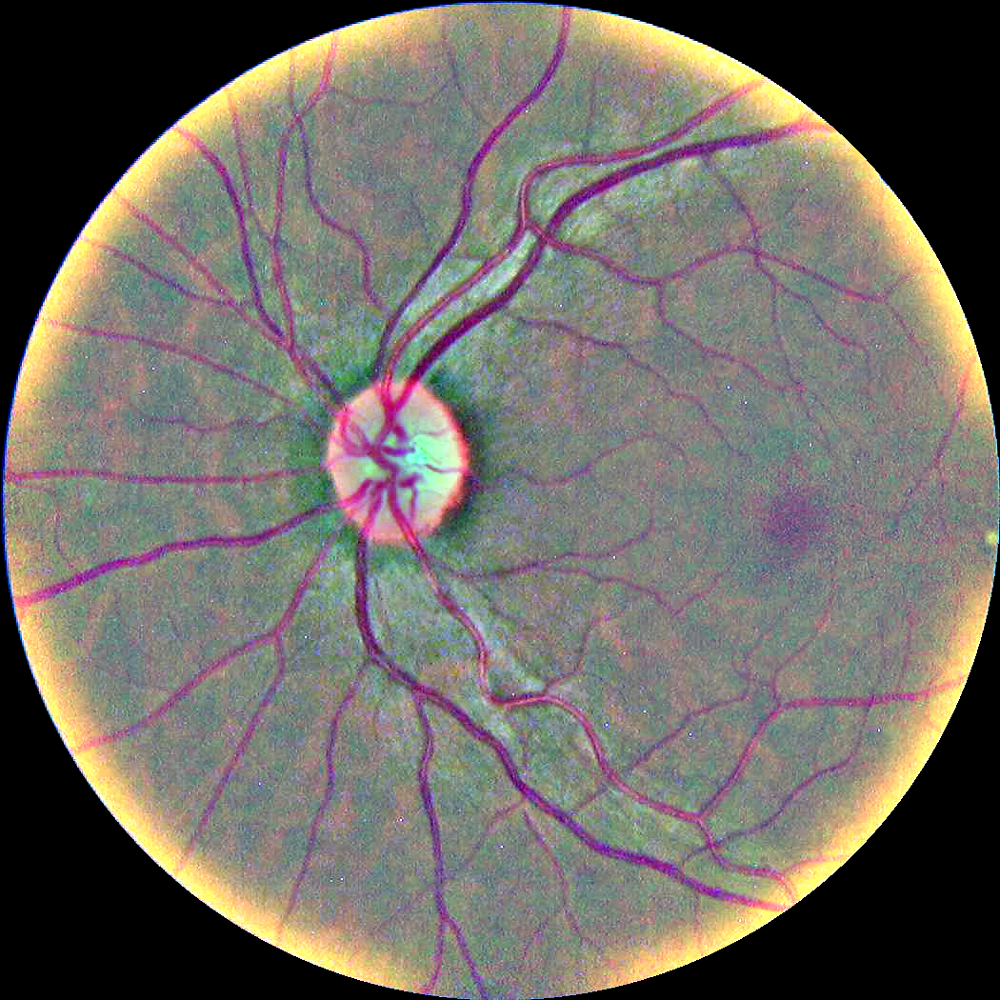

In [ ]:
img2 = preprocessed_img("/content/00f6c1be5a33.png")
cv2_imshow(img2)

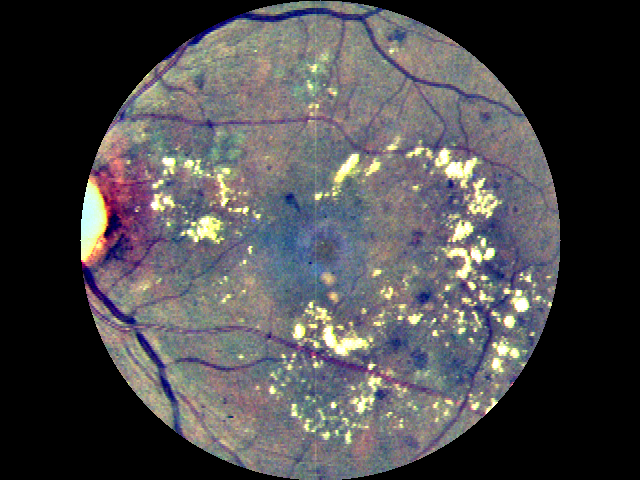

In [ ]:
img2 = preprocessed_img("/content/0af338c60d2d.png")
cv2_imshow(img2)

In [ ]:
from zipfile import ZipFile
file_name = "/content/class_0.zip"

with ZipFile(file_name,'r') as openZip:
  openZip.extractall()
  print('Done')

Done


In [ ]:
from glob import glob
import pandas as pd

In [ ]:
img_paths = glob("/content/class_0/*.jpg")

In [ ]:
data = pd.DataFrame(img_paths, columns=['Img_paths'])

In [ ]:
data['preprocessed_img'] = data['Img_paths'].apply(preprocessed_img)

In [ ]:
data.head()

,Img_paths,preprocessed_img
0,/content/class_0/68.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,/content/class_0/233.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,/content/class_0/370.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,/content/class_0/259.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
4,/content/class_0/272.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [ ]:
path = data['Img_paths'][0]
path.split('/')[-1]

'68.jpg'

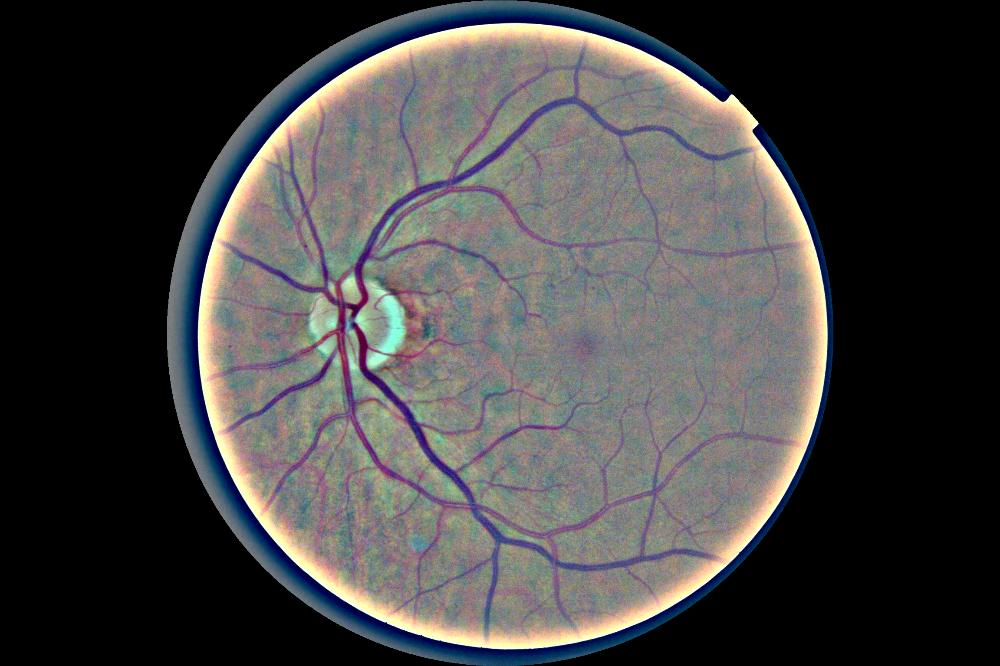

In [ ]:
cv2_imshow(data['preprocessed_img'][4])

In [ ]:
len(data['preprocessed_img'])

151

In [ ]:
"aa"+str(2)

'aa2'

In [ ]:
for i in range(len(data['preprocessed_img'])):
  img = data['preprocessed_img'][i]
  original_path = data['Img_paths'][i]
  name = original_path.split("/")[-1]
  file_name = '/content/sample_data/preprocessed_imgs/'+name
  cv2.imwrite(file_name,img)

In [ ]:
data2 = pd.read_csv("/content/a. IDRiD_Disease Grading_Training Labels.csv")

In [ ]:
data2.head()

,Image name,Retinopathy grade,Risk of macular edema,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11
0,IDRiD_001,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,IDRiD_002,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IDRiD_003,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,IDRiD_004,3,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,IDRiD_005,4,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
data2 = data2.iloc[:,0:3]
data2.head()

,Image name,Retinopathy grade,Risk of macular edema
0,IDRiD_001,3,2
1,IDRiD_002,3,2
2,IDRiD_003,2,2
3,IDRiD_004,3,2
4,IDRiD_005,4,0


In [ ]:
data2['Retinopathy grade'].value_counts()

2    136
0    134
3     74
4     49
1     20
Name: Retinopathy grade, dtype: int64

In [ ]:
import matplotlib.pyplot as plt
plt.plot()

,Image name,Risk of macular edema
Retinopathy grade,,
0,IDRiD_118,0
1,IDRiD_021,0
2,IDRiD_003,2
3,IDRiD_001,2
4,IDRiD_005,0


<Axes: >

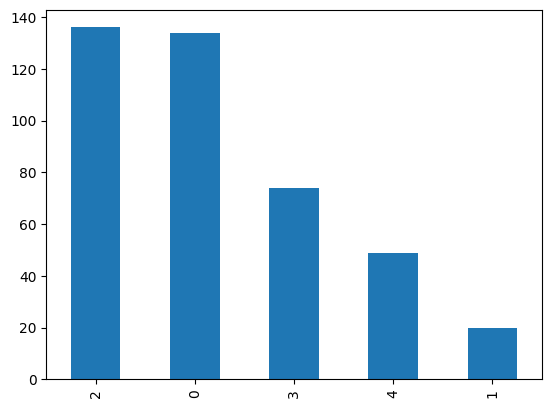

In [ ]:
data2['Retinopathy grade'].value_counts().plot(kind='bar')

# Aptos Dataset

In [ ]:
data3 = pd.read_csv("/content/train.csv")

In [ ]:
data3.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


<Axes: >

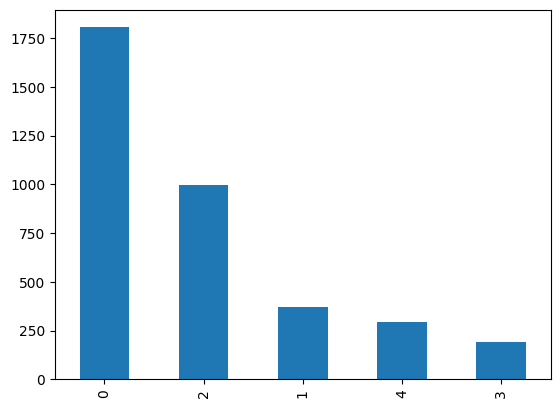

In [ ]:
data3['diagnosis'].value_counts().plot(kind='bar')

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
def plot_classes(df,title):
    df_group = pd.DataFrame(df.groupby('diagnosis').agg('size').reset_index())
    df_group.columns = ['diagnosis','count']

    sns.set(rc={'figure.figsize':(10,5)}, style = 'whitegrid')
    sns.barplot(x = 'diagnosis',y='count',data = df_group)
    plt.title('Output Class Distribution ' + str(title))
    plt.show()

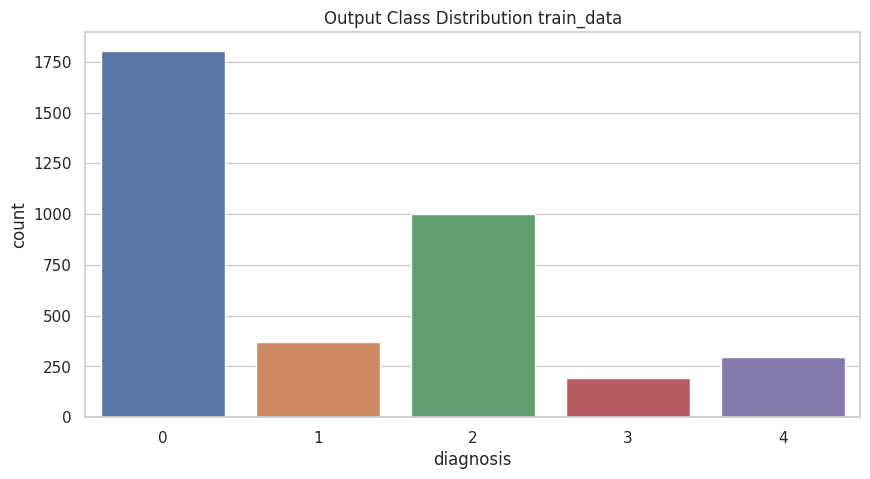

In [ ]:
plot_classes(data3, "train_data")

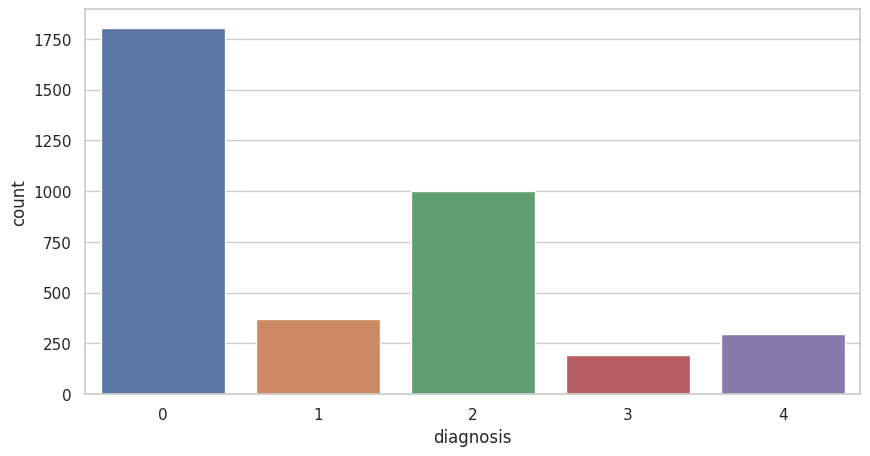

In [ ]:
sns.barplot(x=data3['diagnosis'].value_counts().index, y=data3['diagnosis'].value_counts())
plt.xlabel("diagnosis")
plt.ylabel("count")
plt.show()

In [ ]:
data3['diagnosis'].value_counts().index

Int64Index([0, 2, 1, 4, 3], dtype='int64')

In [ ]:
! gdown --id 1ascKr9s7lW8r6mBPjlOnIJ6EU6JM_ZN7

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1ascKr9s7lW8r6mBPjlOnIJ6EU6JM_ZN7
To: /content/train_images.zip
100% 8.60G/8.60G [01:28<00:00, 97.7MB/s]


In [ ]:
from zipfile import ZipFile
file_name = "/content/train_images.zip"

with ZipFile(file_name,'r') as openZip:
  openZip.extractall()
  print('Done')

Done


In [ ]:
from glob import glob
import pandas as pd

In [ ]:
img_paths = glob("/content/train_images/*.png")

In [ ]:
data = pd.DataFrame(img_paths, columns=['Img_paths'])

In [ ]:
diagnosis = pd.read_csv("/content/train.csv")

In [ ]:
diagnosis.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [ ]:
def f(id_code):
  return '/content/train_images/'+id_code+'.png'

In [ ]:
data['Img_paths'] = diagnosis['id_code'].apply(f)

In [ ]:
data['diagnosis'] = diagnosis['diagnosis']

In [ ]:
data.head()

,Img_paths,diagnosis
0,/content/train_images/000c1434d8d7.png,2
1,/content/train_images/001639a390f0.png,4
2,/content/train_images/0024cdab0c1e.png,1
3,/content/train_images/002c21358ce6.png,0
4,/content/train_images/005b95c28852.png,0


In [ ]:
path1 = data['Img_paths'][0]
img = cv2.imread(path1)

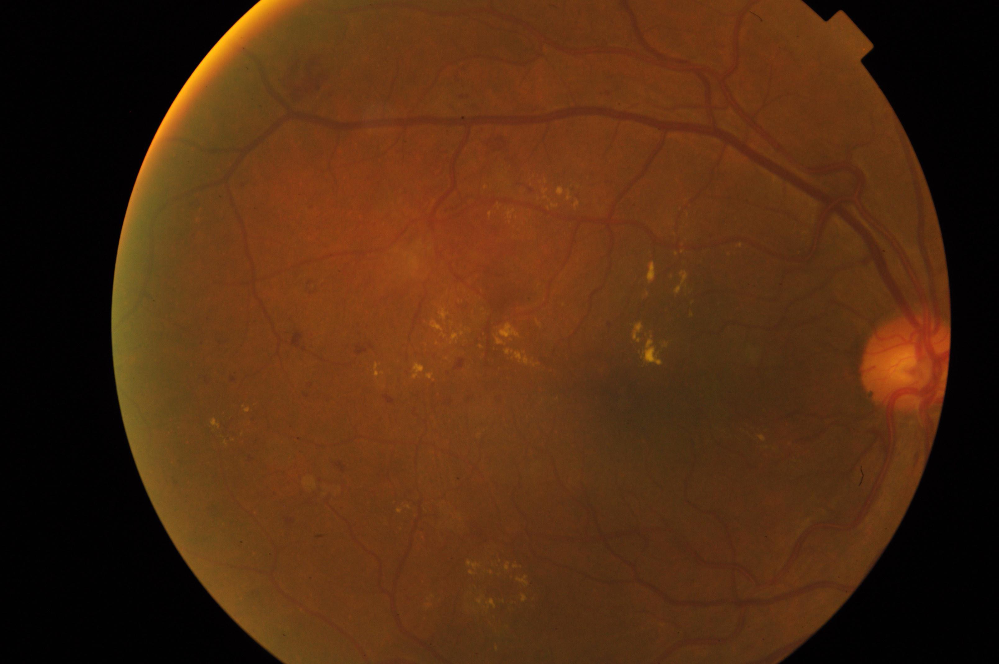

In [ ]:
cv2_imshow(img)

In [ ]:
data['preprocessed_img'] = data['Img_paths'].apply(preprocessed_img)

In [ ]:
data.head()

,Img_paths,diagnosis,preprocessed_img
0,/content/train_images/000c1434d8d7.png,2,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
1,/content/train_images/001639a390f0.png,4,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
2,/content/train_images/0024cdab0c1e.png,1,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
3,/content/train_images/002c21358ce6.png,0,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
4,/content/train_images/005b95c28852.png,0,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


In [ ]:
import numpy as np

In [ ]:
def preprocessed_img(img_path):
  img = cv2.imread(img_path)
  img = cv2.resize(img, (512, 512))
  img_t = cv2.addWeighted(img,4, cv2.GaussianBlur(img , (0,0) , 30) ,-4 ,128)
  img = img_t
  h, w = img.shape[:2]
  cx, cy = w // 2, h // 2

  # Define the radius of the circle
  r = min(cx, cy)

  # Create a mask
  mask = np.zeros((h, w), np.uint8)
  cv2.circle(mask, (cx, cy), r, 1, -1)

  # Apply the mask to the image
  result = cv2.bitwise_and(img, img, mask=mask)

  # Save the cropped image or display it on screen
  return result

In [ ]:
img = preprocessed_img('/content/000c1434d8d7.png')
img.shape

(512, 512, 3)

In [ ]:
len(data['preprocessed_img'])

3662

In [ ]:
for i in range(len(data['preprocessed_img'])):
  img = data['preprocessed_img'][i]
  original_path = data['Img_paths'][i]
  name = original_path.split("/")[-1]
  file_name = '/content/sample_data/preprocessed_imgs/'+name
  cv2.imwrite(file_name,img)

In [ ]:
!zip -r /content/preprocessed_files.zip /content/sample_data/preprocessed_imgs

  adding: content/sample_data/preprocessed_imgs/ (stored 0%)
  adding: content/sample_data/preprocessed_imgs/976082127e2a.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/26d60db3bbfd.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/d9ad2a0ec026.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/c406325360b1.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/ea15a290eb96.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/c80b0f27541a.png (deflated 0%)
  adding: content/sample_data/preprocessed_imgs/d25b8a8ad3c4.png (deflated 0%)
  adding: content/sample_data/preprocessed_imgs/be8697eb2078.png (deflated 0%)
  adding: content/sample_data/preprocessed_imgs/0104b032c141.png (deflated 0%)
  adding: content/sample_data/preprocessed_imgs/354b8911d6ed.png (deflated 0%)
  adding: content/sample_data/preprocessed_imgs/4c3c1ed09771.png (deflated 1%)
  adding: content/sample_data/preprocessed_imgs/711d1480d2e3.png (defl

In [ ]:
data.head()

,Img_paths,diagnosis,preprocessed_img,preprocessed_img_paths
0,/content/train_images/000c1434d8d7.png,2,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",None
1,/content/train_images/001639a390f0.png,4,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",None
2,/content/train_images/0024cdab0c1e.png,1,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",None
3,/content/train_images/002c21358ce6.png,0,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",None
4,/content/train_images/005b95c28852.png,0,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...",None


In [ ]:
def f2(img_path):
  filename = img_path.split('/')[-1]
  filepath = "/content/sample_data/preprocessed_imgs/"+file_name

In [ ]:
data['preprocessed_img_paths'] = data['Img_paths'].apply(f2)

In [ ]:
import pandas as pd

In [ ]:
! gdown --id 1VY1lvRgMkoKlqkEusN_Nhu6J07Fc6zzr

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1VY1lvRgMkoKlqkEusN_Nhu6J07Fc6zzr
To: /content/preprocessed_files.zip
100% 1.03G/1.03G [00:19<00:00, 51.9MB/s]


In [ ]:
from zipfile import ZipFile
file_name = "/content/preprocessed_files.zip"

with ZipFile(file_name,'r') as openZip:
  openZip.extractall()
  print('Done')

Done


In [ ]:
daignosis = pd.read_csv("/content/train.csv")
daignosis.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [ ]:
data = pd.DataFrame(daignosis['diagnosis'].astype(str))

In [ ]:
def f(id_code):
  return '/content/content/sample_data/preprocessed_imgs/'+id_code+'.png'

In [ ]:
data['Img_paths'] = daignosis['id_code'].apply(f)

In [ ]:
def f2(img_path):
  filename = img_path.split('/')[-1]
  filepath = "/content/content/sample_data/preprocessed_imgs/"+file_name

In [ ]:
data.head()

,diagnosis,Img_paths
0,2,/content/content/sample_data/preprocessed_imgs...
1,4,/content/content/sample_data/preprocessed_imgs...
2,1,/content/content/sample_data/preprocessed_imgs...
3,0,/content/content/sample_data/preprocessed_imgs...
4,0,/content/content/sample_data/preprocessed_imgs...


In [ ]:
import tensorflow as tf

In [ ]:
data['Img_paths'][1]

'/content/content/sample_data/preprocessed_imgs/001639a390f0.png'

In [ ]:
tf.random.set_seed(42)

In [ ]:
Img_size = (512, 512)
batch_size = 16

datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255,
                                                          validation_split=0.2)

In [ ]:
train_gen = datagen.flow_from_dataframe(dataframe = data,
                                        x_col = 'Img_paths',
                                        y_col = 'diagnosis',
                                        subset = 'training',
                                        seed = 1,
                                        batch_size= batch_size,
                                        color_mode = 'rgb',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = Img_size)

valid_gen = datagen.flow_from_dataframe(dataframe = data,
                                        x_col = 'Img_paths',
                                        y_col = 'diagnosis',
                                        subset = 'validation',
                                        seed = 1,
                                        batch_size= batch_size,
                                        color_mode = 'rgb',
                                        shuffle = True,
                                        class_mode = 'categorical',
                                        target_size = Img_size)

Found 2930 validated image filenames belonging to 5 classes.
Found 732 validated image filenames belonging to 5 classes.


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def plot_loss_curves(history):
  """
  Returns seperate loss curves for training and validation metrics
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  #plot loss
  plt.plot(epochs, loss, label = "training loss")
  plt.plot(epochs, val_loss, label = "val_loss")
  plt.title("loss")
  plt.xlabel("epochs")
  plt.legend()

  plt.figure()
  #plot accuracy
  plt.plot(epochs, accuracy, label = "training accuracy")
  plt.plot(epochs, val_accuracy, label = "val_accuracy")
  plt.title("accuracy")
  plt.xlabel("epochs")
  plt.legend()

## ResNet50

In [ ]:
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D

In [ ]:
base_model = tf.keras.applications.ResNet50V2(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-10]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)

x = Dense(5, activation = 'softmax')(x)

model1 = tf.keras.Model(inputs = inputs, outputs = x)

In [ ]:
model1.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 30
history3 = model1.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/30
184/184 [==============================] - 64s 314ms/step - loss: 0.7179 - accuracy: 0.7403 - val_loss: 0.7227 - val_accuracy: 0.7500
Epoch 2/30
184/184 [==============================] - 55s 300ms/step - loss: 0.4568 - accuracy: 0.8386 - val_loss: 0.5487 - val_accuracy: 0.8019
Epoch 3/30
184/184 [==============================] - 54s 294ms/step - loss: 0.3221 - accuracy: 0.8925 - val_loss: 0.7293 - val_accuracy: 0.7336
Epoch 4/30
184/184 [==============================] - 55s 297ms/step - loss: 0.2292 - accuracy: 0.9392 - val_loss: 0.5830 - val_accuracy: 0.7978
Epoch 5/30
184/184 [==============================] - 54s 294ms/step - loss: 0.1461 - accuracy: 0.9676 - val_loss: 0.7246 - val_accuracy: 0.7568
Epoch 6/30
184/184 [==============================] - 55s 301ms/step - loss: 0.1079 - accuracy: 0.9805 - val_loss: 0.6105 - val_accuracy: 0.8005
Epoch 7/30
184/184 [==============================] - 58s 315ms/step - loss: 0.0836 - accuracy: 0.9840 - val_loss: 0.9524 - val_ac

In [ ]:
import cv2 as cv2
import numpy as np

In [ ]:
test1.shape

(2848, 4288, 3)

In [ ]:
test1 = preprocessed_img("/content/IDRiD_003.jpg")
test1 = test1/255.
output = model1.predict(tf.expand_dims(test1,axis = 0))

1/1 [==============================] - 0s 27ms/step


In [ ]:
def preprocessed_img(img_path):
  img = cv2.imread(img_path)
  img_t = cv2.addWeighted(img,4, cv2.GaussianBlur(img , (0,0) , 30) ,-4 ,128)
  img = img_t
  img = cv2.resize(img, (512, 512))
  h, w = img.shape[:2]
  cx, cy = w // 2, h // 2

  # Define the radius of the circle
  r = min(cx, cy)

  # Create a mask
  mask = np.zeros((h, w), np.uint8)
  cv2.circle(mask, (cx, cy), r, 1, -1)

  # Apply the mask to the image
  result = cv2.bitwise_and(img, img, mask=mask)

  # Save the cropped image or display it on screen
  return result

In [ ]:
print(tf.argmax(output[0]))

tf.Tensor(2, shape=(), dtype=int64)


In [ ]:
model1.save("Renet.h5")

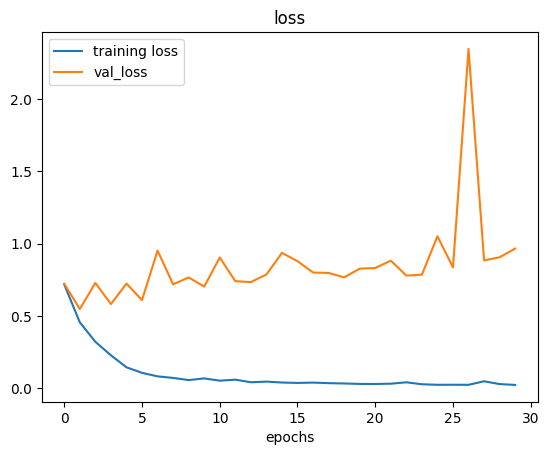

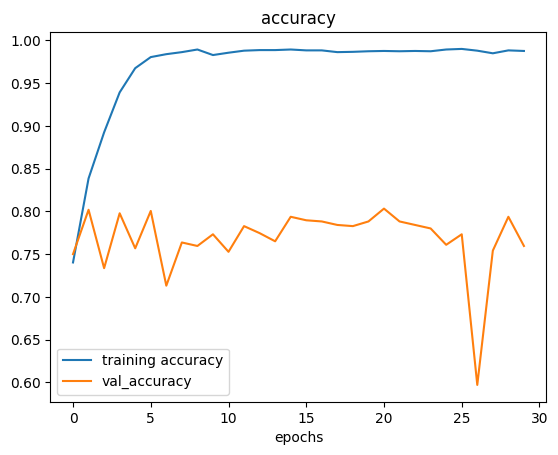

In [ ]:
plot_loss_curves(history3)

In [ ]:
base_model = tf.keras.applications.ResNet50V2(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-10]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(5, activation = 'softmax')(x)

model2 = tf.keras.Model(inputs = inputs, outputs = x)

In [ ]:
model2.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 20
history3 = model2.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/20
184/184 [==============================] - 72s 359ms/step - loss: 0.7252 - accuracy: 0.7317 - val_loss: 0.6279 - val_accuracy: 0.7732
Epoch 2/20
184/184 [==============================] - 55s 296ms/step - loss: 0.4733 - accuracy: 0.8324 - val_loss: 0.5673 - val_accuracy: 0.7705
Epoch 3/20
184/184 [==============================] - 55s 300ms/step - loss: 0.3565 - accuracy: 0.8765 - val_loss: 0.7817 - val_accuracy: 0.6872
Epoch 4/20
184/184 [==============================] - 57s 309ms/step - loss: 0.2395 - accuracy: 0.9280 - val_loss: 0.6564 - val_accuracy: 0.7418
Epoch 5/20
184/184 [==============================] - 55s 300ms/step - loss: 0.1805 - accuracy: 0.9509 - val_loss: 0.6604 - val_accuracy: 0.7555
Epoch 6/20
184/184 [==============================] - 66s 360ms/step - loss: 0.1209 - accuracy: 0.9737 - val_loss: 0.6223 - val_accuracy: 0.7937
Epoch 7/20
184/184 [==============================] - 54s 294ms/step - loss: 0.0918 - accuracy: 0.9819 - val_loss: 0.6983 - val_ac

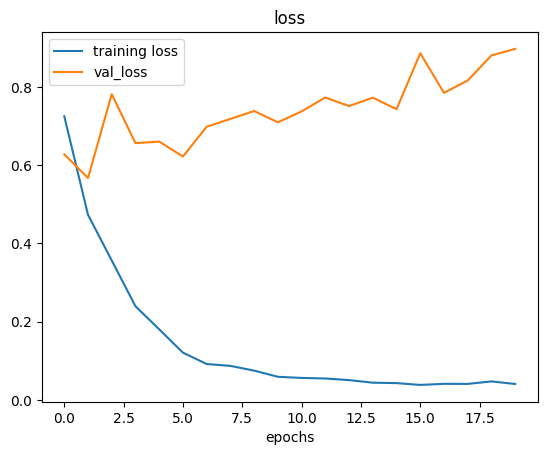

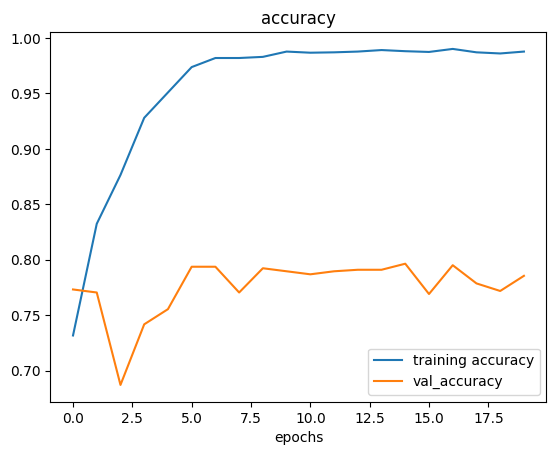

In [ ]:
plot_loss_curves(history3)

In [ ]:
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-10]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(5, activation = 'softmax')(x)

model3 = tf.keras.Model(inputs = inputs, outputs = x)

16705208/16705208 [==============================] - 2s 0us/step


In [ ]:
model3.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 20
history4 = model3.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/20
184/184 [==============================] - 76s 364ms/step - loss: 1.3208 - accuracy: 0.4860 - val_loss: 1.4346 - val_accuracy: 0.4604
Epoch 2/20
184/184 [==============================] - 57s 307ms/step - loss: 1.3103 - accuracy: 0.4922 - val_loss: 1.3182 - val_accuracy: 0.4604
Epoch 3/20
184/184 [==============================] - 54s 292ms/step - loss: 1.3066 - accuracy: 0.4966 - val_loss: 1.3312 - val_accuracy: 0.4604
Epoch 4/20
184/184 [==============================] - 54s 294ms/step - loss: 1.2986 - accuracy: 0.4952 - val_loss: 1.3300 - val_accuracy: 0.4604
Epoch 5/20
184/184 [==============================] - 52s 282ms/step - loss: 1.2921 - accuracy: 0.4980 - val_loss: 1.3661 - val_accuracy: 0.4604
Epoch 6/20
184/184 [==============================] - 53s 285ms/step - loss: 1.2977 - accuracy: 0.4997 - val_loss: 1.3820 - val_accuracy: 0.4604
Epoch 7/20
184/184 [==============================] - 62s 339ms/step - loss: 1.2882 - accuracy: 0.5010 - val_loss: 1.3411 - val_ac

In [ ]:
base_model = tf.keras.applications.ResNet50V2(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-100]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(5, activation = 'softmax')(x)

model4 = tf.keras.Model(inputs = inputs, outputs = x)

In [ ]:
model4.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 20
history4 = model4.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/20
184/184 [==============================] - 122s 555ms/step - loss: 0.6461 - accuracy: 0.7573 - val_loss: 0.7615 - val_accuracy: 0.7322
Epoch 2/20
184/184 [==============================] - 81s 442ms/step - loss: 0.3845 - accuracy: 0.8604 - val_loss: 0.5852 - val_accuracy: 0.7951
Epoch 3/20
184/184 [==============================] - 82s 445ms/step - loss: 0.2433 - accuracy: 0.9160 - val_loss: 0.8323 - val_accuracy: 0.7486
Epoch 4/20
184/184 [==============================] - 82s 446ms/step - loss: 0.1689 - accuracy: 0.9526 - val_loss: 0.6961 - val_accuracy: 0.7910
Epoch 5/20
184/184 [==============================] - 82s 442ms/step - loss: 0.0927 - accuracy: 0.9737 - val_loss: 0.7324 - val_accuracy: 0.7691
Epoch 6/20
184/184 [==============================] - 83s 453ms/step - loss: 0.0815 - accuracy: 0.9785 - val_loss: 0.8806 - val_accuracy: 0.7964
Epoch 7/20
184/184 [==============================] - 83s 449ms/step - loss: 0.0559 - accuracy: 0.9819 - val_loss: 0.8940 - val_a

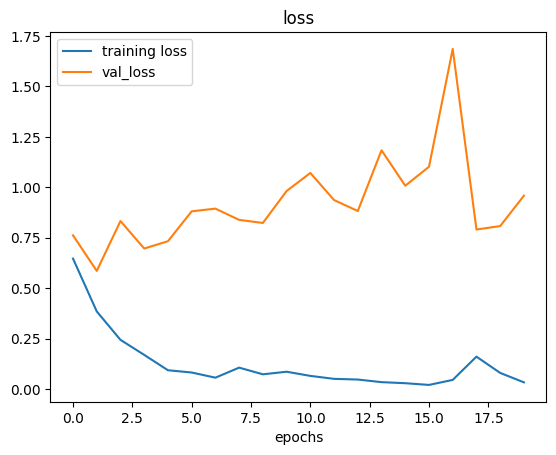

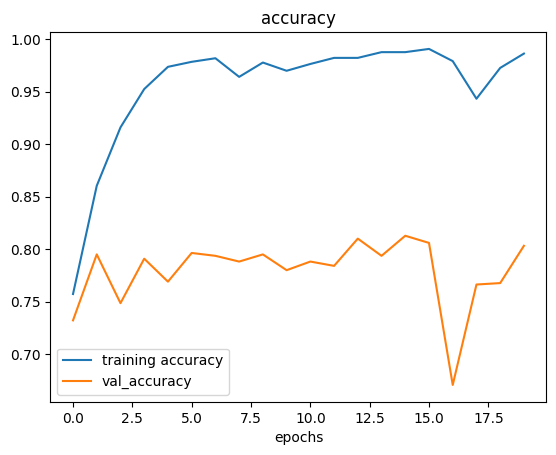

In [ ]:
plot_loss_curves(history4)

In [ ]:
model4.save("Renet50_80acc.h5")

In [ ]:
base_model = tf.keras.applications.ResNet50V2(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-150]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(5, activation = 'softmax')(x)

model5 = tf.keras.Model(inputs = inputs, outputs = x)

In [ ]:
model5.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 20
history5 = model5.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/20
184/184 [==============================] - 135s 583ms/step - loss: 0.6486 - accuracy: 0.7567 - val_loss: 0.6411 - val_accuracy: 0.7828
Epoch 2/20
184/184 [==============================] - 106s 576ms/step - loss: 0.3915 - accuracy: 0.8556 - val_loss: 0.5775 - val_accuracy: 0.7787
Epoch 3/20
184/184 [==============================] - 106s 574ms/step - loss: 0.2340 - accuracy: 0.9256 - val_loss: 0.6744 - val_accuracy: 0.7445
Epoch 4/20
184/184 [==============================] - 106s 578ms/step - loss: 0.1381 - accuracy: 0.9611 - val_loss: 0.7514 - val_accuracy: 0.8101
Epoch 5/20
184/184 [==============================] - 105s 572ms/step - loss: 0.1263 - accuracy: 0.9611 - val_loss: 0.7640 - val_accuracy: 0.7773
Epoch 6/20
184/184 [==============================] - 106s 576ms/step - loss: 0.0873 - accuracy: 0.9765 - val_loss: 0.9535 - val_accuracy: 0.7869
Epoch 7/20
184/184 [==============================] - 106s 576ms/step - loss: 0.0613 - accuracy: 0.9809 - val_loss: 0.8728 -

In [ ]:
base_model = tf.keras.applications.EfficientNetV2B0(include_top=False)
base_model.trainable = True

# Freeze all layers except for the last 10
for layer in base_model.layers[:-250]:
  layer.trainable = False

inputs = tf.keras.layers.Input(shape=(512, 512, 3))

x = base_model(inputs)

x = GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(5, activation = 'softmax')(x)

model6 = tf.keras.Model(inputs = inputs, outputs = x)

In [ ]:
model6.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 20
history6 = model6.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/20
184/184 [==============================] - 133s 471ms/step - loss: 0.8185 - accuracy: 0.7225 - val_loss: 0.6259 - val_accuracy: 0.7650
Epoch 2/20
184/184 [==============================] - 81s 439ms/step - loss: 0.5958 - accuracy: 0.7843 - val_loss: 0.5761 - val_accuracy: 0.7828
Epoch 3/20
184/184 [==============================] - 79s 431ms/step - loss: 0.5321 - accuracy: 0.8092 - val_loss: 0.5101 - val_accuracy: 0.8033
Epoch 4/20
184/184 [==============================] - 80s 432ms/step - loss: 0.4659 - accuracy: 0.8321 - val_loss: 0.5199 - val_accuracy: 0.7992
Epoch 5/20
184/184 [==============================] - 79s 430ms/step - loss: 0.4166 - accuracy: 0.8440 - val_loss: 0.5075 - val_accuracy: 0.8033
Epoch 6/20
184/184 [==============================] - 79s 429ms/step - loss: 0.3646 - accuracy: 0.8724 - val_loss: 0.5113 - val_accuracy: 0.8210
Epoch 7/20
184/184 [==============================] - 79s 429ms/step - loss: 0.3248 - accuracy: 0.8829 - val_loss: 0.5726 - val_a

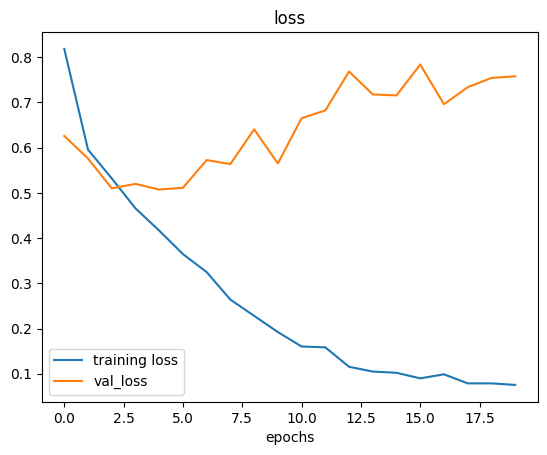

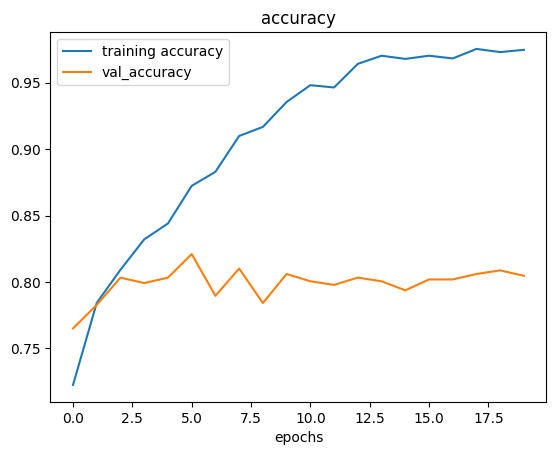

In [ ]:
plot_loss_curves(history6)

In [ ]:
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers.experimental import preprocessing

In [ ]:
data_aug_layer = Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.3),
    #preprocessing.RandomZoom(0.3),
    #preprocessing.RandomHeight(0.3),
    #preprocessing.RandomWidth(0.3)
    #preprocessing.Rescale(1./255)
], name = 'data_aug_layer')

In [ ]:
base_model = tf.keras.applications.ResNet50(include_top = False)
base_model.trainable = True

for layer in base_model.layers[:-150]:
  layer.trainable = False

input = Input(shape = (512, 512, 3))
x = data_aug_layer(input, training = True)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dense(5, activation = 'softmax')(x)

model7 = tf.keras.Model(inputs = input, outputs = x)

In [ ]:
model7.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
len(base_model.layers)

175

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 30
history7 = model7.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/30
184/184 [==============================] - 134s 728ms/step - loss: 0.2758 - accuracy: 0.8922 - val_loss: 2.0536 - val_accuracy: 0.4563
Epoch 2/30
184/184 [==============================] - 134s 725ms/step - loss: 0.2750 - accuracy: 0.8969 - val_loss: 0.6010 - val_accuracy: 0.8005
Epoch 3/30
184/184 [==============================] - 133s 724ms/step - loss: 0.2816 - accuracy: 0.8901 - val_loss: 0.8119 - val_accuracy: 0.7732
Epoch 4/30
184/184 [==============================] - 134s 728ms/step - loss: 0.2470 - accuracy: 0.9092 - val_loss: 1.1625 - val_accuracy: 0.6844
Epoch 5/30
184/184 [==============================] - 134s 728ms/step - loss: 0.2401 - accuracy: 0.9123 - val_loss: 1.2634 - val_accuracy: 0.7486
Epoch 6/30
184/184 [==============================] - 134s 727ms/step - loss: 0.2189 - accuracy: 0.9181 - val_loss: 0.7660 - val_accuracy: 0.7418
Epoch 7/30
184/184 [==============================] - 142s 774ms/step - loss: 0.2389 - accuracy: 0.9137 - val_loss: 1.0376 -

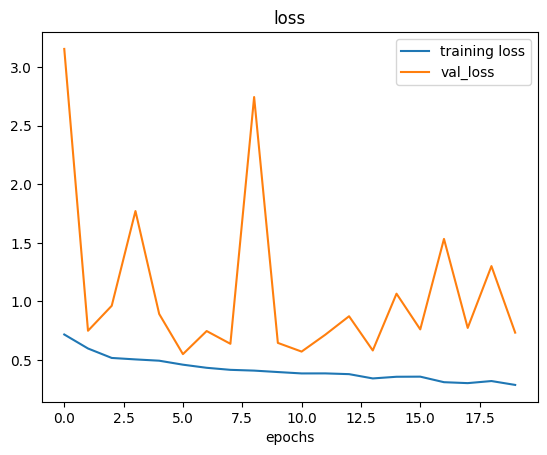

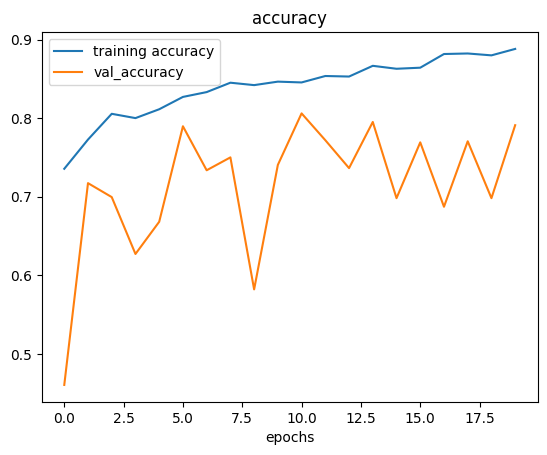

In [ ]:
plot_loss_curves(history7)

In [ ]:
base_model = tf.keras.applications.InceptionV3(include_top = False)
base_model.trainable = True

for layer in base_model.layers[:-150]:
  layer.trainable = False

input = Input(shape = (512, 512, 3))
x = data_aug_layer(input, training = True)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dense(5, activation = 'softmax')(x)

model8 = tf.keras.Model(inputs = input, outputs = x)

87910968/87910968 [==============================] - 5s 0us/step


In [ ]:
model8.compile(loss=tf.keras.losses.categorical_crossentropy,
               optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine tuning you typically lower the learning rate by some amount
               metrics = ['accuracy'])

In [ ]:
# fine tune for another 15 epochs
fine_tune_epochs = 30
history8 = model8.fit(train_gen,
                      epochs = fine_tune_epochs,
                      steps_per_epoch=len(train_gen),
                      validation_data=valid_gen,
                      validation_steps=len(valid_gen))

Epoch 1/30
184/184 [==============================] - 115s 424ms/step - loss: 0.6771 - accuracy: 0.7440 - val_loss: 0.5848 - val_accuracy: 0.7883
Epoch 2/30
184/184 [==============================] - 73s 395ms/step - loss: 0.5194 - accuracy: 0.8031 - val_loss: 0.5291 - val_accuracy: 0.7964
Epoch 3/30
184/184 [==============================] - 74s 402ms/step - loss: 0.4630 - accuracy: 0.8290 - val_loss: 0.5726 - val_accuracy: 0.7678
Epoch 4/30
184/184 [==============================] - 75s 407ms/step - loss: 0.4333 - accuracy: 0.8331 - val_loss: 0.5582 - val_accuracy: 0.7787
Epoch 5/30
184/184 [==============================] - 75s 408ms/step - loss: 0.3716 - accuracy: 0.8601 - val_loss: 0.4864 - val_accuracy: 0.7978
Epoch 6/30
184/184 [==============================] - 76s 415ms/step - loss: 0.3440 - accuracy: 0.8645 - val_loss: 0.5535 - val_accuracy: 0.7992
Epoch 7/30
184/184 [==============================] - 76s 410ms/step - loss: 0.3027 - accuracy: 0.8898 - val_loss: 0.5711 - val_a

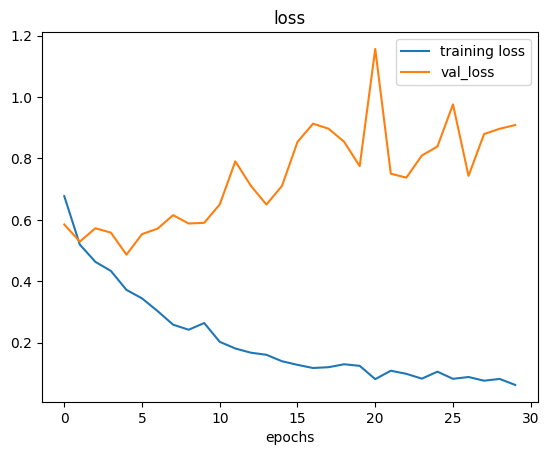

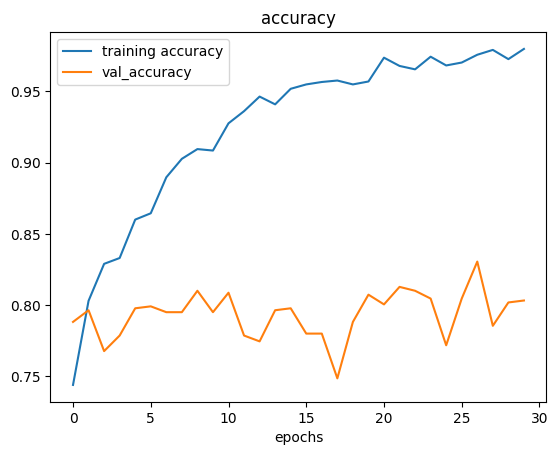

In [ ]:
plot_loss_curves(history8)